# Run Simulation of multiple y motifs

In [1]:
%load_ext autoreload

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import readdy
import math
import scipy
import pandas as pd
import contextlib
import io
import pickle
import glob
import seaborn as sns

from collections import defaultdict, deque
from matplotlib.ticker import FuncFormatter

import sys
import os
sys.path.append(os.path.abspath(os.path.join('..', 'python_scripts')))

from NCG_readdy_sim_y_motif_short import Debye_length, Debye_Hueckel_pot_rep_strength ,Diff_at23C,visc_T,Diff_ES
from NCG_readdy_sim_y_motif_short import run_sim_1,tcl_file_gen,all_types, tcl_file_gen

from NCG_Bay_opt_readdy_sim_y_motif_short import run_p,run_p_dict,run_gp_11
from NCG_Bay_opt_readdy_sim_y_motif_short import gt_1_3,gt_1_1,gt_1_2,gt_1_4,apply_gp
from NCG_Bay_opt_readdy_sim_y_motif_short import gen_all_comb_from_list_of_lists_2, run_p2, get_training_angle_distr_7
from NCG_Bay_opt_readdy_sim_y_motif_short import eval_sim_1_1_la,eval_sim_1_1_hp,eval_sim_1_1_aa,eval_sim_1_1_bm,eval_sim_1_1_ba
from NCG_Bay_opt_readdy_sim_y_motif_short import cg_angle_distr_1_1_hp,cg_angle_distr_1_1_bm,cg_angle_distr_1_3_ba_aa_la,cg_angle_distr_1_1_ba,cg_angle_distr_1_1_aa 

from NCG_readdy_sim_eval_2 import get_particle_number_from_sims,vertices_with_n_edges,vertices_n_edges_away,create_adjacency_matrix,get_conn_mat_eigv_1
from NCG_readdy_sim_eval_2 import get_subgraph_eigenvalues,get_conn_mat_eigv_2,relax_times,storage_mod,loss_mod_deref,relaxation_mod,get_time_avg_storage_loss_mod
from NCG_readdy_sim_eval_2 import get_time_avg_storage_loss_mod_2,get_time_avg_storage_loss_mod_3,calculate_graph_laplacian

## General Parameters

### Units and Temperature

In [3]:
#Set units used in ReaDDy and simulation temperature
custom_units = {'length_unit':'nanometer',
                'time_unit': 'nanoseconds',
                'energy_unit': 'joule'}
system_temperature=273.15 + 40  #293
kbt=system_temperature*1.380649*10**-23

### Diffusion constant

In [4]:
#Diffusion constant either based on Einstein-Smoluchowski, or on exp results for oligos at 23°C
# viscositiy: https://srd.nist.gov/jpcrdreprint/1.555581.pdf
# scaling diffusion constant with T: https://en.wikipedia.org/wiki/Einstein_relation_(kinetic_theory)
# Diffusion constant DNA oligos at 23°C: https://www.sciencedirect.com/science/article/pii/S0021925818310871


#Diffusion const for BP of ds DNA (known at 23°C)
Diff_at23C_1=Diff_at23C(8)

#Viscosity water at sim temp and 23°C
visc_T_sys=visc_T(system_temperature)
visc_T_23=visc_T(273.15+23)

#rescale diffusion const to sim temperature and viscosity (assume scaling like Einstein-Smoluchowski D= kb*T/(6*pi*r*visc) )
Diff_sys_temp=Diff_at23C_1*system_temperature/(23+273.15)  *visc_T_23/visc_T_sys

#use Einstein-Smoluchowski for sphere
Diff_sys_temp_ES=Diff_ES(T=system_temperature,r=2.72/2 *10**-9,eta=visc_T_sys)*10**9
Diff_T_23_ES=Diff_ES(T=23+273.15,r=2.72/2 *10**-9,eta=visc_T_sys)*10**9


print("D for 8bp at 23°C /",23+273.15,"K =",Diff_at23C_1,"nm^2/ns") 
print("D for sphere with r=2.72/2 nm at 23°C /",23+273.15,"K =", Diff_T_23_ES,"nm^2/ns")
print("############################################")
print("mu at",system_temperature-273.15,"°C /", system_temperature,"K =",visc_T_sys," Pa*s" )
print("mu at","23°C /", 23+273.15,"K =" ,visc_T_23," Pa*s" )
print("############################################")
print("D for 8bp at",system_temperature-273.15,"°C /",system_temperature,"K =",Diff_sys_temp,"nm^2/ns")
print("D for sphere with r=2.72/2 nm at" ,system_temperature-273.15,"°C /",system_temperature,"K =",Diff_sys_temp_ES,"nm^2/ns")


D for 8bp at 23°C / 296.15 K = 0.10964057118867664 nm^2/ns
D for sphere with r=2.72/2 nm at 23°C / 296.15 K = 0.2443607133764822 nm^2/ns
############################################
mu at 40.0 °C / 313.15 K = 0.0006527150159023826  Pa*s
mu at 23°C / 296.15 K = 0.0009322679783769826  Pa*s
############################################
D for 8bp at 40.0 °C / 313.15 K = 0.16558810339120872 nm^2/ns
D for sphere with r=2.72/2 nm at 40.0 °C / 313.15 K = 0.25838783519785724 nm^2/ns


### Fixed Parameters

In [5]:
###################
#fixed params:
###################

#bond potential
k_bond_ds=2*10**-19
k_bond_ss=1*10**-19

#bond eq. distance
eq_dist_bb=2.72 

#bond eq. distance fused sticky-ends
eq_dist_fused_bb=2/3 *2.72
eq_dist_bb_s=2/3 *2.72 # distance arm-stickyend

#bond potential surf
k_angle_ss_surf=2e-20  #2.8666666666666663e-20     #2*10**-21
k_angle_ds_surf=3.6666666666666664e-20     #2*10**-20

#angle between monomers V=k*(theta-theta_0)^2
theta_0=np.pi
theta_90=np.pi/2

theta_60=np.pi *1/3
theta_120=np.pi * 2/3
theta_270=np.pi * 3/2
theta_base_y=np.pi*2/3

#volume exclusion
#har rep
k_ex_ds_ds=2*10**-20  *5
k_ex_ss_ds=8*10**-21  *5
k_ex_ss_ss=4*10**-21  *5
dist_ex=1.5          *1 

#DH
c_NaCl = 700 # NaCl concentration in milli mol/L
L_1=6.022*10**23 *c_NaCl * (1.602*10**-19)**2 

charge_eff=0.815 #https://pubs.aip.org/aip/jcp/article/142/23/234901/193554/Introducing-improved-structural-properties-and
DH_len=Debye_length(L=L_1,T=system_temperature) *10**9 #for nm
DH_strength_ds_ds=Debye_Hueckel_pot_rep_strength(q1=charge_eff*16,q2=charge_eff*16,T=system_temperature)*10**9 #for nm
DH_strength_ss_ds=Debye_Hueckel_pot_rep_strength(q1=charge_eff*8,q2=charge_eff*16,T=system_temperature)*10**9 #for nm
DH_strength_ss_ss=Debye_Hueckel_pot_rep_strength(q1=charge_eff*8,q2=charge_eff*8,T=system_temperature)*10**9 #for nm
DH_cutoff=DH_len*4

volume_excl_type="DH"

print("Debye length at",c_NaCl,"mM NaCl:", DH_len, "nm", "cutoff at", DH_cutoff, "nm")
print("DH pot strength ds-ds:", DH_strength_ds_ds, "J*nm")
print("DH pot strength ss-ds:", DH_strength_ss_ds, "J*nm")
print("DH pot strength ss-ss:", DH_strength_ss_ss, "J*nm")
print("Energy of rep. ds-ds at 1 nm:",DH_strength_ds_ds/1 *np.exp(-1/DH_len),"J" )
#DH_strength_ds_ds=DH_strength_ds_ds
#DH_strength_ss_ds=DH_strength_ss_ds
#DH_strength_ss_ss=DH_strength_ss_ss
#DH_cutoff=DH_cutoff

#probabilities bound/unbound
p_SE_fused_x=99.8
p_SE_fused_ortho_x=99.8

p_SE_HP_x=83.8
p_SE_HP_ortho_x=59.9

p_surf_HP_x=6.6
p_surf_HP_ortho_x=6.6

#binding/unbinding rates
#rate of selecting fission reaction in sim
k_fiss_rate_sel=10**7
#y motif
k_b_y_1=0.05
k_ub_y_1=0.005

#y motif hp
k_b_y_hp_1=0
k_ub_y_hp_1=0

#############

#x motif 1
k_b_x_1=0 #0.05
k_ub_x_1=0 #k_b_x_1 * (100-p_SE_fused_x)/p_SE_fused_x  #0.001

#x motif 1 surface
k_b_x_surf_1=k_b_x_1 
k_ub_x_surf_1=k_ub_x_1

#x motif 1 hp
k_b_x_hp_1=0 #0.005
k_ub_x_hp_1=0 #k_b_x_hp_1 * (100-p_SE_HP_x)/p_SE_HP_x 

#x motif 1 surf hp
k_b_x_surf_hp_1=0 #0.005
k_ub_x_surf_hp_1=0 #k_b_x_surf_hp_1 * (100-p_surf_HP_x)/p_surf_HP_x

############

#x motif 2
k_b_x_2=0
k_ub_x_2=0

#x motif 2 surface
k_b_x_surf_2=0 
k_ub_x_surf_2=0

#x motif 2 hp
k_b_x_hp_2=0
k_ub_x_hp_2=0

#x motif 2 surf hp
k_b_x_surf_hp_2=0
k_ub_x_surf_hp_2=0



#time step
t_step=10*10**-3  #standard: 10*10**-3 #appears to work with up to 25*10**-3

#reaction scale
rea_s=2.7

Debye length at 700 mM NaCl: 0.3597519749615454 nm cutoff at 1.4390078998461815 nm
DH pot strength ds-ds: 5.362923735100154e-19 J*nm
DH pot strength ss-ds: 2.681461867550077e-19 J*nm
DH pot strength ss-ss: 1.3407309337750386e-19 J*nm
Energy of rep. ds-ds at 1 nm: 3.328099837257297e-20 J


### General Simulation parameters

In [6]:
#general simulation parameters
system_temperature=system_temperature
box_size=[159,48,48]
custom_units=custom_units
periodic_bc_x=True
periodic_bc_y=True
periodic_bc_z=True

r_sp=15 #radius of spherical inclusion pot
sp_incl_orig=[0,0,0] #origin of sperical inclusion pot
k_sp=0 #k of spherical inclusion, if zero no spherical inclusion
box_a=[-15,-15,-15] #offset of box potential from centre
box_b=[140,30,30] #total length of box potential
k_box=0 #1 *10**-20 #k of box potential


#number of particles
num_y_motif_1=50
num_x_motif_1=0
num_x_motif_2=0
num_surface_1=0

#surface section lengths
#num_rep_unit=4
#len_fill_surf_a=2
#len_binding_surf=4
#len_fill_surf_b=2

#option to use HP template
use_y_1_HP_template=False
use_x_1_HP_template=False
use_x_2_HP_template=False

#positions of particles
#y_motif_1_ini=[np.asarray([e]) for e in np.random.uniform(size=(num_y_motif_1,3)) * np.asarray(box_b)/5 - np.asarray(box_b)/5 * 0.5]
y_motif_1_ini = [np.asarray([e]) for e in np.random.uniform(size=(num_y_motif_1, 3)) * np.asarray(box_b) - np.asarray(box_b) * 0.5]

#y_motif_1_ini=[np.asarray([[0,0,0]])]
y_motif_1_rot=True

x_motif_1_ini=[np.asarray([[0,0,0]])]
x_motif_1_rot=False

x_motif_2_ini=[np.asarray([[-10,0,0]])]
x_motif_2_rot=False

surf_1_ini=[np.asarray([[0,0,0]])]

#time steps
t_tot=5*10**6  #500000

#evaluate reactions


#folder
folder="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short"
name="y_test_1_" #"x_test_1_"
add_num_1=0
     

#other options


sim_kernel="SingleCPU"
sim_threads=1
track_num_particles=["y_link_a_1","y_link_fused_a_1","y_link_b_1","y_link_fused_b_1","y_link_c_1","y_link_fused_c_1",
                     "y_link_hp_a_1", "y_link_hp_b_1", "y_link_hp_c_1",
                     
                     "x_link_a_1","x_link_fused_a_1","x_link_b_1","x_link_fused_b_1","x_link_c_1","x_link_fused_c_1",
                     "x_link_a_2","x_link_fused_a_2","x_link_b_2","x_link_fused_b_2","x_link_c_2","x_link_fused_c_2",
                     "x_link_hp_a_1", "x_link_hp_b_1", "x_link_hp_c_1",
                     "x_link_hp_a_2", "x_link_hp_b_2", "x_link_hp_c_2",
                     
                     "x_surf_link_d_1","x_surf_link_fused_d_1","x_surf_link_d_2","x_surf_link_fused_d_2",
                     "x_surf_link_hp_d_1","x_surf_link_hp_d_2"
                    ]
eval_reac=True
eval_top_reac=True

checkpoint_path=None #"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Bayes_opt_Y_motif_short/"

new_checkpoint=None
max_n_saves=1 #max checkpoint saves
rec_stride=100 #recording stride
sim_skin=0 #1000 #simulation skin


In [7]:
#specify which parameters are to be optimised over which range

#wide param range
k_angle_ds_base_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10) 
k_angle_ds_arm_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_oppa_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ss_link_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_fused_link_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_hp_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
theta_base_x_range=np.linspace(90 ,180 ,4)*np.pi/180 #np.linspace(40 ,120 ,10)
theta_oppa_x_range=np.linspace(135 ,180 ,4)*np.pi/180 #np.linspace(140 ,180 ,10)



#Prior to optimization, use parameter value from middle of range for unoptimized sim
k_angle_ds_base=k_angle_ds_base_range[0]
k_angle_ds_arm=k_angle_ds_arm_range[0]
k_angle_ds_oppa=k_angle_ds_oppa_range[0]
k_angle_ss_link=k_angle_ss_link_range[0]
k_angle_ds_fused_link=k_angle_ds_fused_link_range[0]
k_angle_ds_hp=k_angle_ds_hp_range[0]
theta_base_x=theta_base_x_range[0]
theta_oppa_x=theta_oppa_x_range[0]

### Previously optimized parameters

In [9]:
with open('/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/optimal_params_2.pkl', 'rb') as file:
    dict_opt_params_all_steps = pickle.load(file)

k_angle_ds_base=dict_opt_params_all_steps["k_angle_ds_base"] 
k_angle_ds_arm=dict_opt_params_all_steps["k_angle_ds_arm"]
k_angle_ss_link=dict_opt_params_all_steps["k_angle_ss_link"]
k_angle_ds_fused_link=dict_opt_params_all_steps["k_angle_ds_fused_link"]
k_angle_ds_hp=dict_opt_params_all_steps["k_angle_ds_hp"]
theta_base_x=dict_opt_params_all_steps["theta_base_x"]

### Input Dictionary

In [10]:
#input dictionary
run_sim_1_input={"name":name,
             "folder":folder,
             "add_num_1":add_num_1,
              
             "system_temperature":system_temperature,
             "box_size":box_size,
             "custom_units":custom_units,
             "periodic_bc_x":periodic_bc_x,
             "periodic_bc_y":periodic_bc_y,
             "periodic_bc_z":periodic_bc_z,
              
             "r_sp":r_sp,
             "sp_incl_orig":sp_incl_orig,
             "k_sp":k_sp,
             "box_a":box_a,
             "box_b":box_b,
             "k_box":k_box,
    
              
             "num_y_motif_1":num_y_motif_1,
             "num_x_motif_1":num_x_motif_1,
             "num_x_motif_2":num_x_motif_2,
             "num_surface_1":num_surface_1,
             "y_motif_1_ini":y_motif_1_ini,
             "x_motif_1_ini":x_motif_1_ini,
             "x_motif_2_ini":x_motif_2_ini,
             "surf_1_ini":surf_1_ini,
             "y_motif_1_rot":y_motif_1_rot,
             "x_motif_1_rot":x_motif_1_rot,
             "x_motif_2_rot":x_motif_2_rot,
                 
             "use_y_1_HP_template":use_y_1_HP_template,
             "use_x_1_HP_template":use_x_1_HP_template,
             "use_x_2_HP_template":use_x_2_HP_template,
             
             "Diff_sys_temp":Diff_sys_temp,
             "k_bond_ds":k_bond_ds,
             "k_bond_ss":k_bond_ss,
             "eq_dist_bb":eq_dist_bb,
             "eq_dist_fused_bb":eq_dist_fused_bb,
             "eq_dist_bb_s":eq_dist_bb_s,
             "k_angle_ds_base":k_angle_ds_base,
             "k_angle_ds_arm":k_angle_ds_arm,
             "k_angle_ds_oppa":k_angle_ds_oppa,
             "k_angle_ss_link":k_angle_ss_link,
             "k_angle_ds_fused_link":k_angle_ds_fused_link,
             "k_angle_ds_hp":k_angle_ds_hp,
             "k_angle_ss_surf":k_angle_ss_surf,
             "k_angle_ds_surf":k_angle_ds_surf,
             "theta_0":theta_0,
             "theta_90":theta_90,
             "theta_60":theta_60,
             "theta_120":theta_120,
             "theta_270":theta_270,
             "theta_base_x":theta_base_x,
             "theta_base_y":theta_base_y,
             "theta_oppa_x":theta_oppa_x,
             
             "volume_excl_type":volume_excl_type,
             "k_ex_ds_ds":k_ex_ds_ds,
             "k_ex_ss_ds":k_ex_ss_ds,
             "k_ex_ss_ss":k_ex_ss_ss,
             "dist_ex":dist_ex,
             "DH_strength_ds_ds":DH_strength_ds_ds,
             "DH_strength_ss_ds":DH_strength_ss_ds,
             "DH_strength_ss_ss":DH_strength_ss_ss,
             "DH_len":DH_len,
             "DH_cutoff":DH_cutoff,
              
              
             "k_fiss_rate_sel":k_fiss_rate_sel,
             "k_b_y_1":k_b_y_1,
             "k_ub_y_1":k_ub_y_1,
             "k_b_y_hp_1":k_b_y_hp_1,
             "k_ub_y_hp_1":k_ub_y_hp_1,
             "k_b_x_1":k_b_x_1,
             "k_ub_x_1":k_ub_x_1,
             "k_b_x_surf_1":k_b_x_surf_1,
             "k_ub_x_surf_1":k_ub_x_surf_1,
             "k_b_x_hp_1":k_b_x_hp_1,
             "k_ub_x_hp_1":k_ub_x_hp_1,
             "k_b_x_surf_hp_1":k_b_x_surf_hp_1,
             "k_ub_x_surf_hp_1":k_ub_x_surf_hp_1,
             "k_b_x_2":k_b_x_2,
             "k_ub_x_2":k_ub_x_2,
             "k_b_x_surf_2":k_b_x_surf_2,
             "k_ub_x_surf_2":k_ub_x_surf_2,
             "k_b_x_hp_2":k_b_x_hp_2,
             "k_ub_x_hp_2":k_ub_x_hp_2,
             "k_b_x_surf_hp_2":k_b_x_surf_hp_2,
             "k_ub_x_surf_hp_2":k_ub_x_surf_hp_2,
                
             "t_step":t_step,
             "rea_s":rea_s,
             "t_tot":t_tot,
             
             "sim_kernel":sim_kernel,
             "sim_threads":sim_threads,
             "track_num_particles":track_num_particles,
             "eval_reac":eval_reac,
             "eval_top_reac":eval_top_reac,
             "checkpoint_path":checkpoint_path,
             "new_checkpoint":new_checkpoint,
             "max_n_saves":max_n_saves,
             "rec_stride":rec_stride,
             "sim_skin":sim_skin
    
    
}

## Run Sim

#### Optimized Parameters

In [11]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.5

In [12]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/"
    run_sim_1_input_c["name"]="y_short_opt_1_multi_1_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

100%|██████████████████████████████████████████████████████████████████████| 5000000/5000000 [1:30:30<00:00, 920.73it/s]


In [13]:
### Running Simulations with variing parameters

run_sim_1_input["k_ub_y_1"] = 0.05

In [14]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/"
    run_sim_1_input_c["name"]="y_short_opt_1_multi_2_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

100%|█████████████████████████████████████████████████████████████████████| 5000000/5000000 [1:00:52<00:00, 1368.91it/s]


In [15]:
### Running Simulations with variing parameters

run_sim_1_input["k_ub_y_1"] = 0.005

In [16]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/"
    run_sim_1_input_c["name"]="y_short_opt_1_multi_3_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

100%|█████████████████████████████████████████████████████████████████████| 5000000/5000000 [1:08:01<00:00, 1225.11it/s]


In [17]:
### Running Simulations with variing parameters

run_sim_1_input["k_ub_y_1"] = 0.0005

In [18]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/"
    run_sim_1_input_c["name"]="y_short_opt_1_multi_4_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true



  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

100%|██████████████████████████████████████████████████████████████████████| 5000000/5000000 [1:24:11<00:00, 989.77it/s]


In [19]:
### Running Simulations with variing parameters

run_sim_1_input["k_ub_y_1"] = 0

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/"
    run_sim_1_input_c["name"]="y_short_opt_1_multi_5_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]


Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true



  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

  0%|                                                                                       | 0/5000000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (true, true, true)
 - box size = (159, 48, 48)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
     * 

 29%|████████████████████▍                                                 | 1461298/5000000 [26:54<1:50:05, 535.70it/s]

#### unoptimized parameters 10^-24

In [9]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.5

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_1_multi_1_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [11]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.05

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_1_multi_2_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [13]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.005

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_1_multi_3_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [15]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.0005

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_1_multi_4_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [17]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_1_multi_5_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

#### unoptimized parameters 10^-20

In [34]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.5

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_2_multi_1_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [36]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.05

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_2_multi_2_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [38]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.005

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_2_multi_3_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [40]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.0005

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_2_multi_4_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [42]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_2_multi_5_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

#### unoptimized parameters 10^-18

In [ ]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.5

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_3_multi_1_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [ ]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.05

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_3_multi_2_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [ ]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.005

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_3_multi_3_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [ ]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0.0005

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_3_multi_4_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

In [ ]:
### Running Simulations with variing parameters
run_sim_1_input["k_ub_y_1"] = 0

In [ ]:
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
    run_sim_1_input_c["name"]="y_short_unopt_3_multi_5_"
    run_sim_1_input_c["add_num_1"]=i
    run_sim_1_input_c["max_n_saves"]=1
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

## Create TCL



In [10]:
# Directory containing your .h5 files
folder = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/"

# Pattern to find all relevant files
pattern = os.path.join(folder, "y_short_opt_5_multi_*_0.h5")
files = glob.glob(pattern)

for filepath in files:
    filename = os.path.basename(filepath)                    
    xyz_filename = filename + ".xyz"                        
    xyz_filepath = os.path.join(folder, xyz_filename)

    # Remove .h5 extension for tcl file
    if filename.endswith(".h5"):
        xyz_base = filename[:-3]                            
    else:
        xyz_base = filename

    tcl_filename = xyz_base + ".xyz.tcl"                    
    tcl_filepath = os.path.join(folder, tcl_filename)

    traj = readdy.Trajectory(filepath)

    # Find all unique particle types
    unique_types = set()
    first = True
    for frame in traj.read_observable_particles():
        if first:
            print("First frame structure:", frame)
            first = False

        types = frame[0]
        if np.isscalar(types):
            unique_types.add(str(types))
        else:
            unique_types.update(str(t) for t in types)

    radii = {typ: 1.36 for typ in unique_types}
    traj.convert_to_xyz(particle_radii=radii)
    tcl_data = tcl_file_gen(xyz_filename, "431 129 129") #change box size
    np.savetxt(tcl_filepath, tcl_data, delimiter=" ", fmt="%s")

    print(f"Processed: {filepath}")

print("All matching files have been processed.")

First frame structure: [      0     100     200 ... 4999800 4999900 5000000]
[2025-09-21 19:50:04] [warning] type x_surf_int_1 had explicitly no specified radius, using 1.0
[2025-09-21 19:50:04] [warning] type x_surf_fill_1 had explicitly no specified radius, using 1.0
[2025-09-21 19:50:04] [warning] type x_link_hp_c_1 had explicitly no specified radius, using 1.0
[2025-09-21 19:50:04] [warning] type x_link_hp_b_1 had explicitly no specified radius, using 1.0
[2025-09-21 19:50:04] [warning] type x_link_hp_b_2 had explicitly no specified radius, using 1.0
[2025-09-21 19:50:04] [warning] type x_link_b_2 had explicitly no specified radius, using 1.0
[2025-09-21 19:50:04] [warning] type x_link_fused_a_1 had explicitly no specified radius, using 1.0
[2025-09-21 19:50:04] [warning] type y_centre_1 had explicitly no specified radius, using 1.0
[2025-09-21 19:50:04] [warning] type y_link_fused_a_1 had explicitly no specified radius, using 1.0
[2025-09-21 19:50:04] [warning] type y_link_c_1 had

## Evaluate bond formation

### cluster sizes

##### unbind 0,5

In [85]:
#load saved config
traj_mech=readdy.Trajectory("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_3_multi_1_0.h5")

times_mech,types_mech,ids_mech,part_positions_mech=traj_mech.read_observable_particles()
time_pt_mech, counts_pt_mech = traj_mech.read_observable_number_of_particles()
#part_pos_eq=part_positions

time_e_mech, energy_mech=traj_mech.read_observable_energy()
time_obs_top_mech,obs_top_mech=traj_mech.read_observable_topologies()

####################
####################
####################

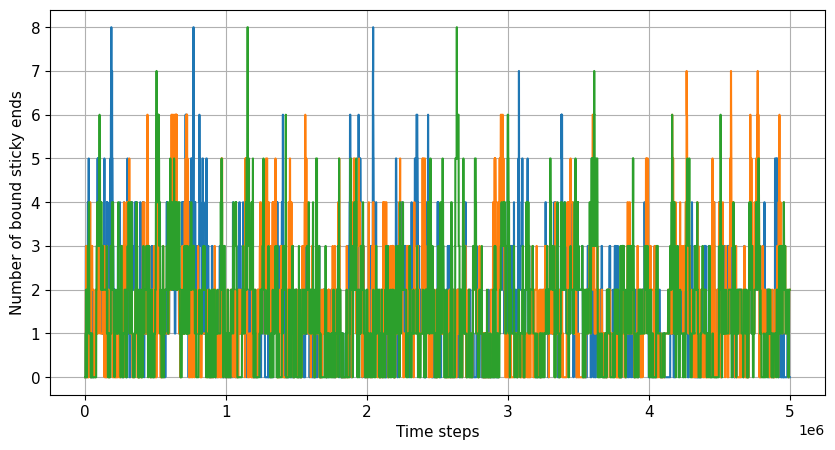

In [86]:
fig=plt.figure(figsize=(10,5))

#plt.errorbar(time_pt_mech,counts_pt_mech[:,1]+counts_pt_mech[:,3]+counts_pt_mech[:,5])
plt.errorbar(time_pt_mech,counts_pt_mech[:,1])
plt.errorbar(time_pt_mech, counts_pt_mech[:,3])
plt.errorbar(time_pt_mech ,counts_pt_mech[:,5])

#plt.xlim(0,10000)
#plt.ylim(-2,10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=11)
plt.xlabel("Time steps",fontsize=11)
plt.grid()

In [87]:
particles_per_component_read_in=[]
for i in range(len(obs_top_mech)):
    comp_lens=[]
    for j in range(len(obs_top_mech[i])):
        comp_lens.append(len(obs_top_mech[i][j].particles)/10)
    particles_per_component_read_in.append(comp_lens)

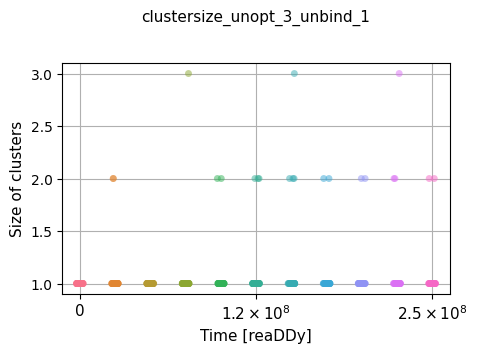

In [88]:
start = 0
stop = 50001
step = 5000
stp_x_l = np.arange(start, stop, step) * 5 * 10**3

fig = plt.figure(figsize=(5, 3))
stp_y = particles_per_component_read_in[start:stop:step]
stp_x = np.arange(0, len(stp_y))
start_x = 0
stop_x = len(stp_x)
step_x = 5
alpha_1 = 0.5
sns.stripplot(data=stp_y, alpha=alpha_1)

def power_of_ten_formatter(x):
    if x == 0:
        return "0"
    exponent = int(np.floor(np.log10(x)))
    coeff = x / 10**exponent
    if np.isclose(coeff, 1):
        return r"$10^{%d}$" % exponent
    else:
        return r"${:.1f}\times 10^{{{}}}$".format(coeff, exponent)

labels = [power_of_ten_formatter(x) for x in stp_x_l[start_x:stop_x:step_x]]
plt.xticks(stp_x[start_x:stop_x:step_x], labels, fontsize=11)

graph_title = "clustersize_unopt_3_unbind_1"
plt.title(graph_title,fontsize=11, pad=30)

plt.ylabel("Size of clusters", fontsize=11)
plt.xlabel("Time [reaDDy]", fontsize=11)
plt.grid()

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = f"{graph_title}.png"
output_path = os.path.join(output_dir, filename)

plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()

##### unbind 0,05

In [89]:
#load saved config
traj_mech=readdy.Trajectory("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_3_multi_2_0.h5")

times_mech,types_mech,ids_mech,part_positions_mech=traj_mech.read_observable_particles()
time_pt_mech, counts_pt_mech = traj_mech.read_observable_number_of_particles()
#part_pos_eq=part_positions

time_e_mech, energy_mech=traj_mech.read_observable_energy()
time_obs_top_mech,obs_top_mech=traj_mech.read_observable_topologies()

####################
####################
####################

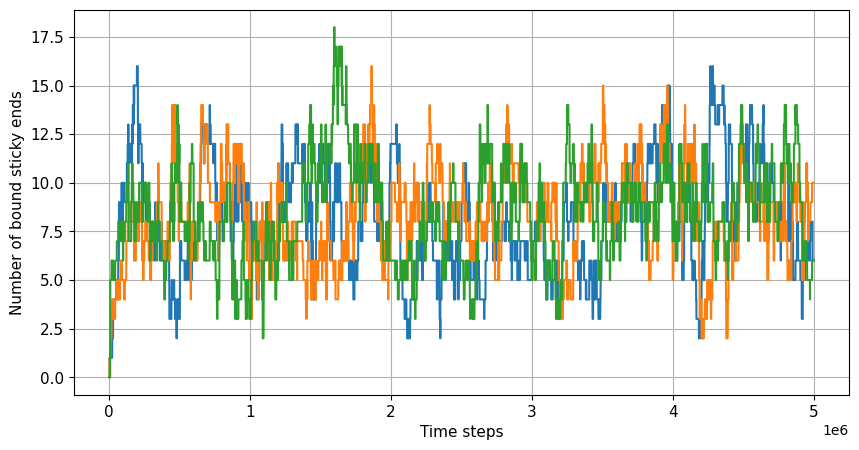

In [90]:
fig=plt.figure(figsize=(10,5))

#plt.errorbar(time_pt_mech,counts_pt_mech[:,1]+counts_pt_mech[:,3]+counts_pt_mech[:,5])
plt.errorbar(time_pt_mech,counts_pt_mech[:,1])
plt.errorbar(time_pt_mech, counts_pt_mech[:,3])
plt.errorbar(time_pt_mech ,counts_pt_mech[:,5])

#plt.xlim(0,10000)
#plt.ylim(-2,10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=11)
plt.xlabel("Time steps",fontsize=11)
plt.grid()

In [91]:
particles_per_component_read_in=[]
for i in range(len(obs_top_mech)):
    comp_lens=[]
    for j in range(len(obs_top_mech[i])):
        comp_lens.append(len(obs_top_mech[i][j].particles)/10)
    particles_per_component_read_in.append(comp_lens)

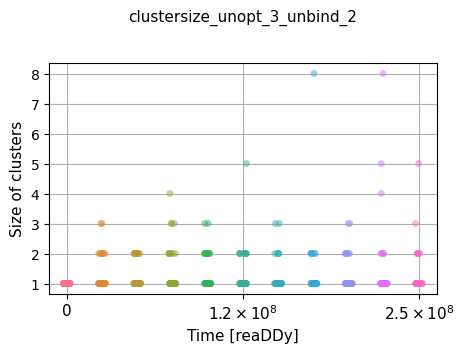

In [92]:
start = 0
stop = 50001
step = 5000
stp_x_l = np.arange(start, stop, step) * 5 * 10**3

fig = plt.figure(figsize=(5, 3))
stp_y = particles_per_component_read_in[start:stop:step]
stp_x = np.arange(0, len(stp_y))
start_x = 0
stop_x = len(stp_x)
step_x = 5
alpha_1 = 0.5
sns.stripplot(data=stp_y, alpha=alpha_1)

def power_of_ten_formatter(x):
    if x == 0:
        return "0"
    exponent = int(np.floor(np.log10(x)))
    coeff = x / 10**exponent
    if np.isclose(coeff, 1):
        return r"$10^{%d}$" % exponent
    else:
        return r"${:.1f}\times 10^{{{}}}$".format(coeff, exponent)

labels = [power_of_ten_formatter(x) for x in stp_x_l[start_x:stop_x:step_x]]
plt.xticks(stp_x[start_x:stop_x:step_x], labels, fontsize=11)

graph_title = "clustersize_unopt_3_unbind_2"
plt.title(graph_title,fontsize=11, pad=30)

plt.ylabel("Size of clusters", fontsize=11)
plt.xlabel("Time [reaDDy]", fontsize=11)
plt.grid()

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = f"{graph_title}.png"
output_path = os.path.join(output_dir, filename)

plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()

##### unbind 0,005

In [93]:
#load saved config
traj_mech=readdy.Trajectory("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_3_multi_3_0.h5")

times_mech,types_mech,ids_mech,part_positions_mech=traj_mech.read_observable_particles()
time_pt_mech, counts_pt_mech = traj_mech.read_observable_number_of_particles()
#part_pos_eq=part_positions

time_e_mech, energy_mech=traj_mech.read_observable_energy()
time_obs_top_mech,obs_top_mech=traj_mech.read_observable_topologies()

####################
####################
####################

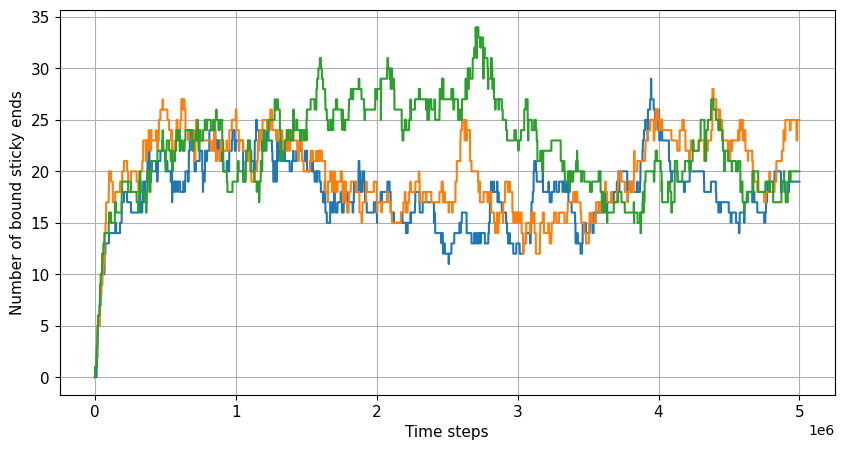

In [94]:
fig=plt.figure(figsize=(10,5))

#plt.errorbar(time_pt_mech,counts_pt_mech[:,1]+counts_pt_mech[:,3]+counts_pt_mech[:,5])
plt.errorbar(time_pt_mech,counts_pt_mech[:,1])
plt.errorbar(time_pt_mech, counts_pt_mech[:,3])
plt.errorbar(time_pt_mech ,counts_pt_mech[:,5])

#plt.xlim(0,10000)
#plt.ylim(-2,10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=11)
plt.xlabel("Time steps",fontsize=11)
plt.grid()

In [95]:
particles_per_component_read_in=[]
for i in range(len(obs_top_mech)):
    comp_lens=[]
    for j in range(len(obs_top_mech[i])):
        comp_lens.append(len(obs_top_mech[i][j].particles)/10)
    particles_per_component_read_in.append(comp_lens)

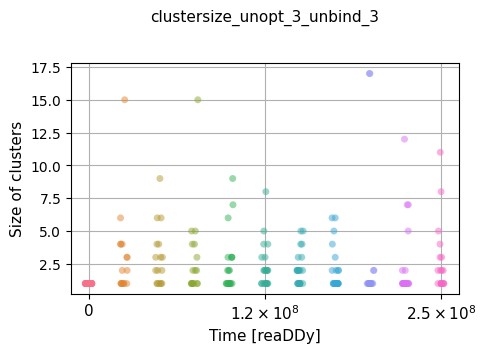

In [96]:
start = 0
stop = 50001
step = 5000
stp_x_l = np.arange(start, stop, step) * 5 * 10**3

fig = plt.figure(figsize=(5, 3))
stp_y = particles_per_component_read_in[start:stop:step]
stp_x = np.arange(0, len(stp_y))
start_x = 0
stop_x = len(stp_x)
step_x = 5
alpha_1 = 0.5
sns.stripplot(data=stp_y, alpha=alpha_1)

# Zehnerpotenz-Formatter mit Nachkommastellen
def zehnerpotenz_formatter(x):
    if x == 0:
        return "0"
    exponent = int(np.floor(np.log10(x)))
    coeff = x / 10**exponent
    if np.isclose(coeff, 1):
        return r"$10^{%d}$" % exponent
    else:
        return r"${:.1f}\times 10^{{{}}}$".format(coeff, exponent)

labels = [zehnerpotenz_formatter(x) for x in stp_x_l[start_x:stop_x:step_x]]
plt.xticks(stp_x[start_x:stop_x:step_x], labels, fontsize=11)

graph_title = "clustersize_unopt_3_unbind_3"
plt.title(graph_title,fontsize=11, pad=30)

plt.ylabel("Size of clusters", fontsize=11)
plt.xlabel("Time [reaDDy]", fontsize=11)
plt.grid()

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = f"{graph_title}.png"
output_path = os.path.join(output_dir, filename)

plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()

##### unbind 0,0005

In [97]:
#load saved config
traj_mech=readdy.Trajectory("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_3_multi_4_0.h5")

times_mech,types_mech,ids_mech,part_positions_mech=traj_mech.read_observable_particles()
time_pt_mech, counts_pt_mech = traj_mech.read_observable_number_of_particles()
#part_pos_eq=part_positions

time_e_mech, energy_mech=traj_mech.read_observable_energy()
time_obs_top_mech,obs_top_mech=traj_mech.read_observable_topologies()

####################
####################
####################

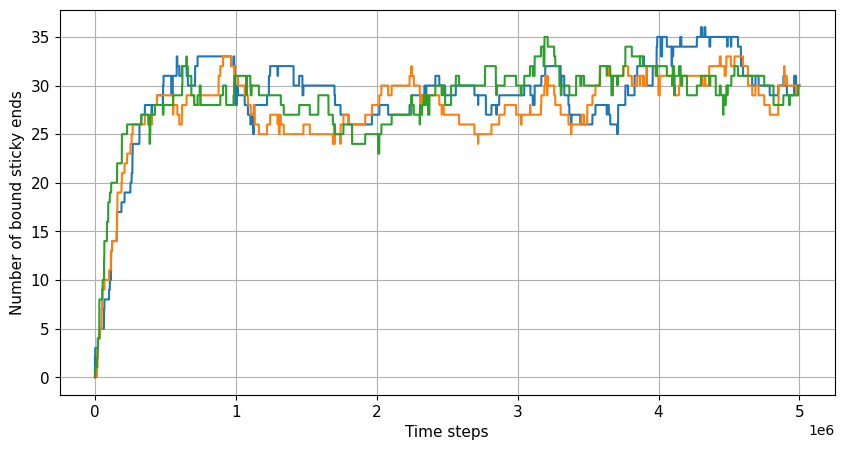

In [98]:
fig=plt.figure(figsize=(10,5))

#plt.errorbar(time_pt_mech,(counts_pt_mech[:,1]+counts_pt_mech[:,3]+counts_pt_mech[:,5])/150)
plt.errorbar(time_pt_mech,counts_pt_mech[:,1])
plt.errorbar(time_pt_mech, counts_pt_mech[:,3])
plt.errorbar(time_pt_mech ,counts_pt_mech[:,5])

#plt.xlim(0,10000)
#plt.ylim(-2,10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=11)
plt.xlabel("Time steps",fontsize=11)
plt.grid()

In [99]:
particles_per_component_read_in=[]
for i in range(len(obs_top_mech)):
    comp_lens=[]
    for j in range(len(obs_top_mech[i])):
        comp_lens.append(len(obs_top_mech[i][j].particles)/10)
    particles_per_component_read_in.append(comp_lens)

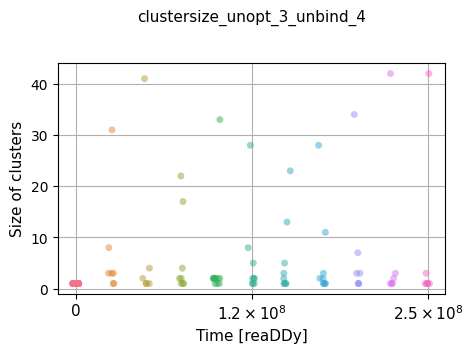

In [100]:
start = 0
stop = 50001
step = 5000
stp_x_l = np.arange(start, stop, step) * 5 * 10**3

fig = plt.figure(figsize=(5, 3))
stp_y = particles_per_component_read_in[start:stop:step]
stp_x = np.arange(0, len(stp_y))
start_x = 0
stop_x = len(stp_x)
step_x = 5
alpha_1 = 0.5
sns.stripplot(data=stp_y, alpha=alpha_1)

# Zehnerpotenz-Formatter mit Nachkommastellen
def zehnerpotenz_formatter(x):
    if x == 0:
        return "0"
    exponent = int(np.floor(np.log10(x)))
    coeff = x / 10**exponent
    if np.isclose(coeff, 1):
        return r"$10^{%d}$" % exponent
    else:
        return r"${:.1f}\times 10^{{{}}}$".format(coeff, exponent)

labels = [zehnerpotenz_formatter(x) for x in stp_x_l[start_x:stop_x:step_x]]
plt.xticks(stp_x[start_x:stop_x:step_x], labels, fontsize=11)

graph_title = "clustersize_unopt_3_unbind_4"
plt.title(graph_title,fontsize=11, pad=30)

plt.ylabel("Size of clusters", fontsize=11)
plt.xlabel("Time [reaDDy]", fontsize=11)
plt.grid()

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = f"{graph_title}.png"
output_path = os.path.join(output_dir, filename)

plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()

##### unbind 0

In [101]:
#load saved config
traj_mech=readdy.Trajectory("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_3_multi_5_0.h5")

times_mech,types_mech,ids_mech,part_positions_mech=traj_mech.read_observable_particles()
time_pt_mech, counts_pt_mech = traj_mech.read_observable_number_of_particles()
#part_pos_eq=part_positions

time_e_mech, energy_mech=traj_mech.read_observable_energy()
time_obs_top_mech,obs_top_mech=traj_mech.read_observable_topologies()

####################
####################
####################

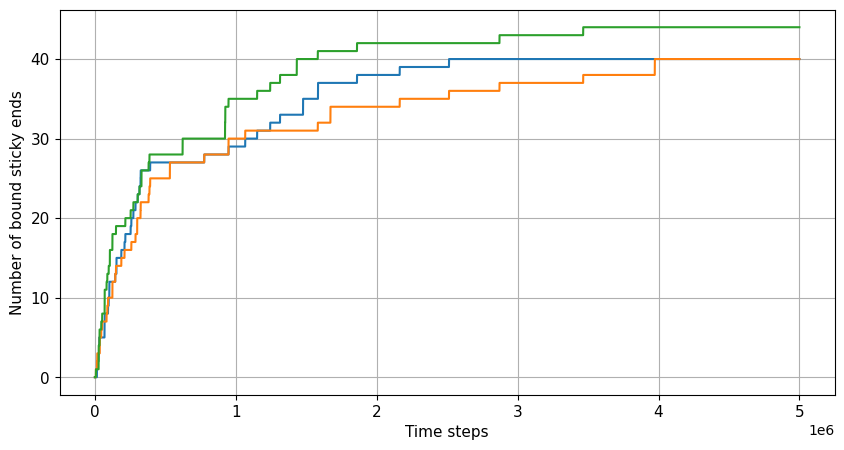

In [102]:
fig=plt.figure(figsize=(10,5))

#plt.errorbar(time_pt_mech,(counts_pt_mech[:,1]+counts_pt_mech[:,3]+counts_pt_mech[:,5])/150)
plt.errorbar(time_pt_mech,counts_pt_mech[:,1])
plt.errorbar(time_pt_mech, counts_pt_mech[:,3])
plt.errorbar(time_pt_mech ,counts_pt_mech[:,5])

#plt.xlim(0,10000)
#plt.ylim(-2,10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=11)
plt.xlabel("Time steps",fontsize=11)
plt.grid()

In [103]:
particles_per_component_read_in=[]
for i in range(len(obs_top_mech)):
    comp_lens=[]
    for j in range(len(obs_top_mech[i])):
        comp_lens.append(len(obs_top_mech[i][j].particles)/10)
    particles_per_component_read_in.append(comp_lens)

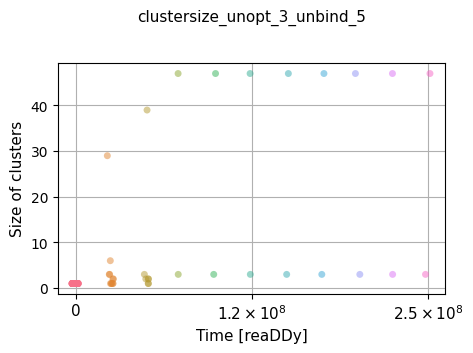

In [104]:
start = 0
stop = 50001
step = 5000
stp_x_l = np.arange(start, stop, step) * 5 * 10**3

fig = plt.figure(figsize=(5, 3))
stp_y = particles_per_component_read_in[start:stop:step]
stp_x = np.arange(0, len(stp_y))
start_x = 0
stop_x = len(stp_x)
step_x = 5
alpha_1 = 0.5
sns.stripplot(data=stp_y, alpha=alpha_1)

# Zehnerpotenz-Formatter mit Nachkommastellen
def zehnerpotenz_formatter(x):
    if x == 0:
        return "0"
    exponent = int(np.floor(np.log10(x)))
    coeff = x / 10**exponent
    if np.isclose(coeff, 1):
        return r"$10^{%d}$" % exponent
    else:
        return r"${:.1f}\times 10^{{{}}}$".format(coeff, exponent)

labels = [zehnerpotenz_formatter(x) for x in stp_x_l[start_x:stop_x:step_x]]
plt.xticks(stp_x[start_x:stop_x:step_x], labels, fontsize=11)

graph_title = "clustersize_unopt_3_unbind_5"
plt.title(graph_title,fontsize=11, pad=30)

plt.ylabel("Size of clusters", fontsize=11)
plt.xlabel("Time [reaDDy]", fontsize=11)
plt.grid()

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = f"{graph_title}.png"
output_path = os.path.join(output_dir, filename)

plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()

### Mittelung

#### einzeln

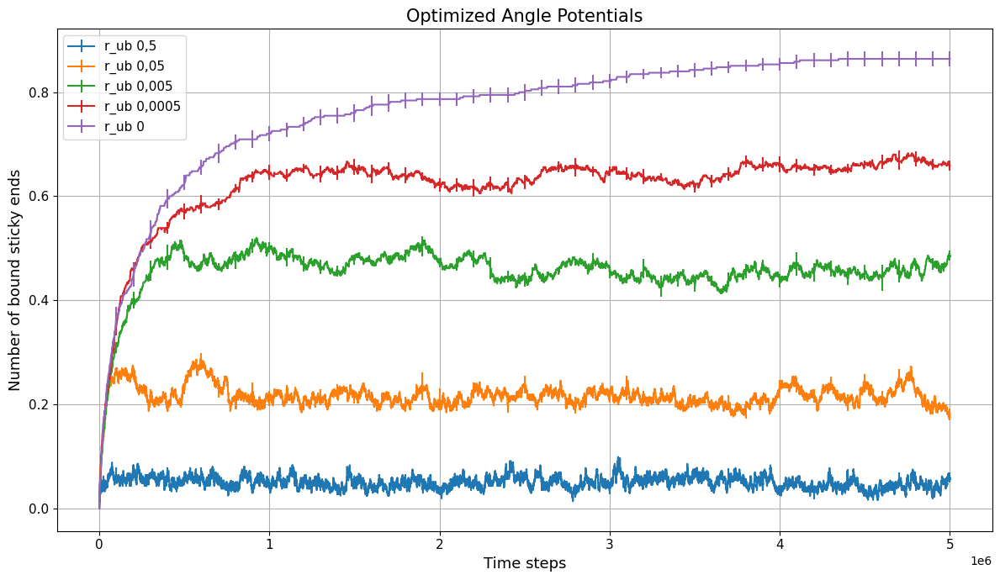

In [105]:
def get_particle_number_from_sims2(folder_names, index_particle_type):
    part_number = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        times, types, ids, part_positions = traj.read_observable_particles()
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        count = []
        for j in range(len(index_particle_type)):
            count.append(counts_pt[:, index_particle_type[j]])
        part_number.append(np.sum(count, axis=0))
    return np.asarray(part_number)

# ubind-Werte zu d
ubind_values = ['0,5', '0,05', '0,005', '0,0005', '0']

# Prepare all file paths for d=1,2,3,4,5 and e=0,1,2,3,4
all_folder_names = []
for d in range(1, 6):  # d = 1..5
    folder_names_d = [
        f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_opt_multi_{d}_{e}.h5"
        for e in range(5)
    ]
    all_folder_names.append(folder_names_d)

index_particle_type = [1, 3, 5]  # as in your example

plt.figure(figsize=(12, 7))

for d, folder_names_d in enumerate(all_folder_names, 1):
    # Load the first file to get the time axis
    traj_ref = readdy.Trajectory(folder_names_d[0])
    time_pt_mech, counts_pt_mech = traj_ref.read_observable_number_of_particles()
    # Get mean and std for this set
    fused_linkers = get_particle_number_from_sims2(folder_names_d, index_particle_type)
    mean_fused_linkers = np.mean(fused_linkers, axis=0) / 150
    std_e_fused_linkers = np.std(fused_linkers, axis=0) / (np.sqrt(fused_linkers.shape[0]) * 150)
    plt.errorbar(
        time_pt_mech, mean_fused_linkers, std_e_fused_linkers, errorevery=1000,
        label=fr'r_ub {ubind_values[d-1]}'
    )

plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=13)
plt.xlabel("Time steps", fontsize=13)
plt.grid(True)
plt.legend(fontsize=11)
plt.title("Optimized Angle Potentials", fontsize=15)
plt.tight_layout()

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = "bound_se_average_1.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

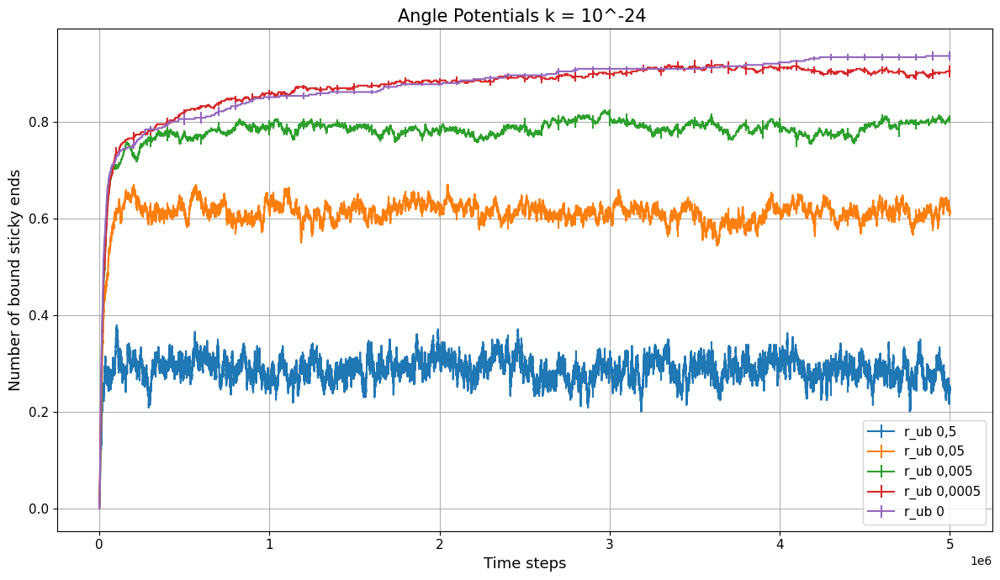

In [106]:
def get_particle_number_from_sims2(folder_names, index_particle_type):
    part_number = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        times, types, ids, part_positions = traj.read_observable_particles()
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        count = []
        for j in range(len(index_particle_type)):
            count.append(counts_pt[:, index_particle_type[j]])
        part_number.append(np.sum(count, axis=0))
    return np.asarray(part_number)

# ubind-Werte zu d
ubind_values = ['0,5', '0,05', '0,005', '0,0005', '0']

# Prepare all file paths for d=1,2,3,4,5 and e=0,1,2,3,4
all_folder_names = []
for d in range(1, 6):  # d = 1..5
    folder_names_d = [
        f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_1_multi_{d}_{e}.h5"
        for e in range(5)
    ]
    all_folder_names.append(folder_names_d)

index_particle_type = [1, 3, 5]  # as in your example

plt.figure(figsize=(12, 7))

for d, folder_names_d in enumerate(all_folder_names, 1):
    # Load the first file to get the time axis
    traj_ref = readdy.Trajectory(folder_names_d[0])
    time_pt_mech, counts_pt_mech = traj_ref.read_observable_number_of_particles()
    # Get mean and std for this set
    fused_linkers = get_particle_number_from_sims2(folder_names_d, index_particle_type)
    mean_fused_linkers = np.mean(fused_linkers, axis=0) / 150
    std_e_fused_linkers = np.std(fused_linkers, axis=0) / (np.sqrt(fused_linkers.shape[0]) * 150)
    plt.errorbar(
        time_pt_mech, mean_fused_linkers, std_e_fused_linkers, errorevery=1000,
        label=fr'r_ub {ubind_values[d-1]}'
    )

plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=13)
plt.xlabel("Time steps", fontsize=13)
plt.grid(True)
plt.legend( fontsize=11)
plt.title("Angle Potentials k = 10^-24 ", fontsize=15)
plt.tight_layout()

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = "bound_se_average_2.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

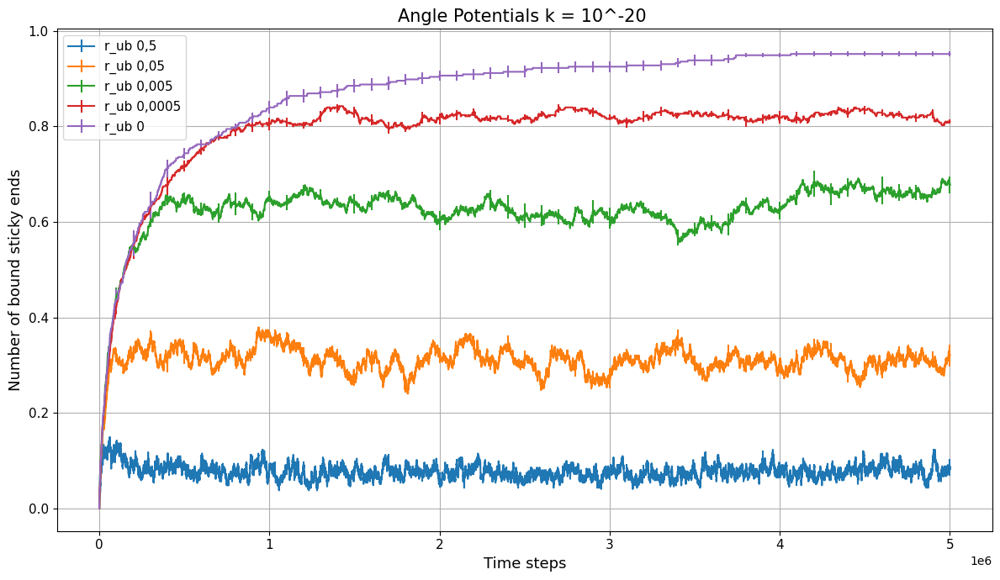

In [107]:
def get_particle_number_from_sims2(folder_names, index_particle_type):
    part_number = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        times, types, ids, part_positions = traj.read_observable_particles()
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        count = []
        for j in range(len(index_particle_type)):
            count.append(counts_pt[:, index_particle_type[j]])
        part_number.append(np.sum(count, axis=0))
    return np.asarray(part_number)

# ubind-Werte zu d
ubind_values = ['0,5', '0,05', '0,005', '0,0005', '0']

# Prepare all file paths for d=1,2,3,4,5 and e=0,1,2,3,4
all_folder_names = []
for d in range(1, 6):  # d = 1..5
    folder_names_d = [
        f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_2_multi_{d}_{e}.h5"
        for e in range(5)
    ]
    all_folder_names.append(folder_names_d)

index_particle_type = [1, 3, 5]  # as in your example

plt.figure(figsize=(12, 7))

for d, folder_names_d in enumerate(all_folder_names, 1):
    # Load the first file to get the time axis
    traj_ref = readdy.Trajectory(folder_names_d[0])
    time_pt_mech, counts_pt_mech = traj_ref.read_observable_number_of_particles()
    # Get mean and std for this set
    fused_linkers = get_particle_number_from_sims2(folder_names_d, index_particle_type)
    mean_fused_linkers = np.mean(fused_linkers, axis=0) / 150
    std_e_fused_linkers = np.std(fused_linkers, axis=0) / (np.sqrt(fused_linkers.shape[0]) * 150)
    plt.errorbar(
        time_pt_mech, mean_fused_linkers, std_e_fused_linkers, errorevery=1000,
        label=fr'r_ub {ubind_values[d-1]}'
    )

plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=13)
plt.xlabel("Time steps", fontsize=13)
plt.grid(True)
plt.legend( fontsize=11)
plt.title("Angle Potentials k = 10^-20 ", fontsize=15)
plt.tight_layout()

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = "bound_se_average_3.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

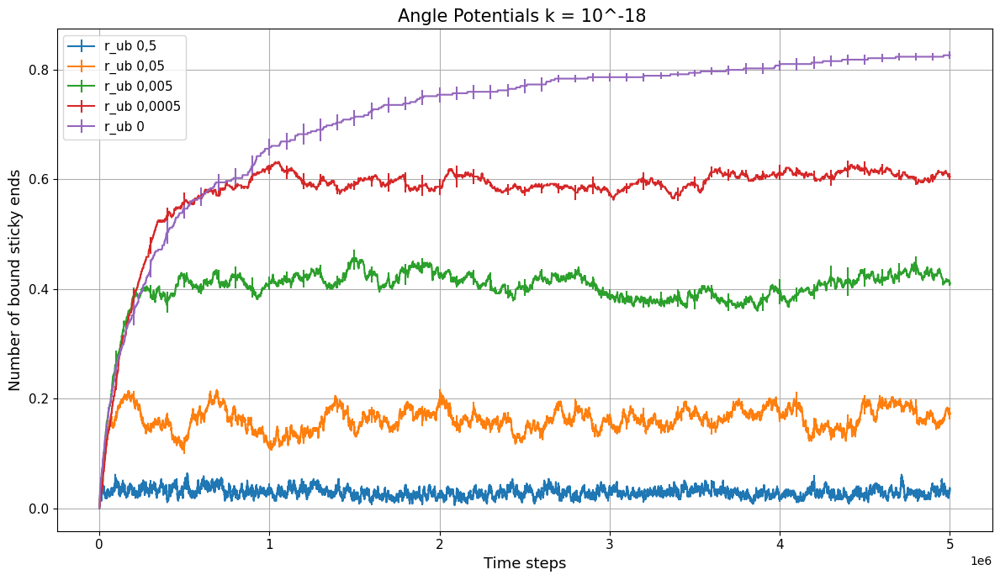

In [108]:
def get_particle_number_from_sims2(folder_names, index_particle_type):
    part_number = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        times, types, ids, part_positions = traj.read_observable_particles()
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        count = []
        for j in range(len(index_particle_type)):
            count.append(counts_pt[:, index_particle_type[j]])
        part_number.append(np.sum(count, axis=0))
    return np.asarray(part_number)

# ubind-Werte zu d
ubind_values = ['0,5', '0,05', '0,005', '0,0005', '0']

# Prepare all file paths for d=1,2,3,4,5 and e=0,1,2,3,4
all_folder_names = []
for d in range(1, 6):  # d = 1..5
    folder_names_d = [
        f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_3_multi_{d}_{e}.h5"
        for e in range(5)
    ]
    all_folder_names.append(folder_names_d)

index_particle_type = [1, 3, 5]  # as in your example

plt.figure(figsize=(12, 7))

for d, folder_names_d in enumerate(all_folder_names, 1):
    # Load the first file to get the time axis
    traj_ref = readdy.Trajectory(folder_names_d[0])
    time_pt_mech, counts_pt_mech = traj_ref.read_observable_number_of_particles()
    # Get mean and std for this set
    fused_linkers = get_particle_number_from_sims2(folder_names_d, index_particle_type)
    mean_fused_linkers = np.mean(fused_linkers, axis=0) / 150
    std_e_fused_linkers = np.std(fused_linkers, axis=0) / (np.sqrt(fused_linkers.shape[0]) * 150)
    plt.errorbar(
        time_pt_mech, mean_fused_linkers, std_e_fused_linkers, errorevery=1000,
        label=fr'r_ub {ubind_values[d-1]}'
    )

plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=13)
plt.xlabel("Time steps", fontsize=13)
plt.grid(True)
plt.legend( fontsize=11)
plt.title("Angle Potentials k = 10^-18 ", fontsize=15)
plt.tight_layout()

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = "bound_se_average_4.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

#### panel

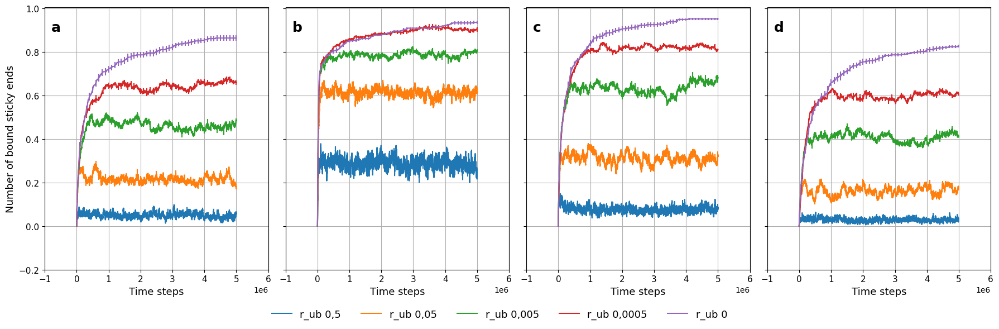

In [10]:
def get_particle_number_from_sims2(folder_names, index_particle_type):
    part_number = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        times, types, ids, part_positions = traj.read_observable_particles()
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        count = []
        for j in range(len(index_particle_type)):
            count.append(counts_pt[:, index_particle_type[j]])
        part_number.append(np.sum(count, axis=0))
    return np.asarray(part_number)

# ubind-Werte zu d (for legend labels)
ubind_values = ['0,5', '0,05', '0,005', '0,0005', '0']

# Prepare all file paths for d=1..5 and e=0..4 for the four panel datasets
panel_file_patterns = [
    "y_short_opt_multi_{d}_{e}.h5",
    "y_short_unopt_1_multi_{d}_{e}.h5",
    "y_short_unopt_2_multi_{d}_{e}.h5",
    "y_short_unopt_3_multi_{d}_{e}.h5"
]
panel_titles = ['a', 'b', 'c', 'd']  # Panel labels

# Build list of lists of filenames for each panel
base_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
panel_folder_names = []
for pattern in panel_file_patterns:
    panel_files = []
    for d in range(1, 6):  # d = 1..5
        files_d = [
            os.path.join(base_dir, pattern.format(d=d, e=e))
            for e in range(5)
        ]
        panel_files.append(files_d)
    panel_folder_names.append(panel_files)

index_particle_type = [1, 3, 5]  # Choose relevant particle types

# Set up the figure and axes for 4 horizontally-arranged panels
fig, axs = plt.subplots(1, 4, figsize=(18, 6), sharey=True)

# For legend collection across all panels
legend_handles = []
legend_labels = []

for panel_idx, (ax, panel_files_d) in enumerate(zip(axs, panel_folder_names)):
    # panel_files_d: List of sets of files for d=1..5
    for d, folder_names_d in enumerate(panel_files_d, 1):
        # Load the first file to get the time axis
        traj_ref = readdy.Trajectory(folder_names_d[0])
        time_pt_mech, counts_pt_mech = traj_ref.read_observable_number_of_particles()
        # Get mean and std for this set
        fused_linkers = get_particle_number_from_sims2(folder_names_d, index_particle_type)
        mean_fused_linkers = np.mean(fused_linkers, axis=0) / 150
        std_e_fused_linkers = np.std(fused_linkers, axis=0) / (np.sqrt(fused_linkers.shape[0]) * 150)
        handle = ax.errorbar(
            time_pt_mech, mean_fused_linkers, std_e_fused_linkers, errorevery=1000,
            label=fr'r_ub {ubind_values[d-1]}'
        )
        # Collect only once for legend (from first panel)
        if panel_idx == 0:
            legend_handles.append(handle[0])
            legend_labels.append(fr'r_ub {ubind_values[d-1]}')

    # Styling: no individual title or legend, add panel label
    ax.set_xticks(ax.get_xticks())
    ax.set_yticks(ax.get_yticks())
    ax.tick_params(labelsize=11)
    ax.set_xlabel("Time steps", fontsize=13)
    if panel_idx == 0:
        ax.set_ylabel("Number of bound sticky ends", fontsize=13)
    ax.grid(True)
    # Panel label in upper left (relative coordinates, bold)
    ax.text(0.03, 0.95, panel_titles[panel_idx], transform=ax.transAxes,
            fontsize=18, fontweight='bold', va='top', ha='left')

# Remove titles and legends from all axes
for ax in axs:
    ax.set_title("")
    ax.legend().remove()

plt.tight_layout(rect=[0, 0.08, 1, 1])  # leave space at the bottom for legend

# Add legend below all panels
fig.legend(legend_handles, legend_labels, loc='lower center', fontsize=13, ncol=len(legend_labels), frameon=False, bbox_to_anchor=(0.5, 0.01))

# Save and show
#output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
#filename = "bound_se_average_panel.png"
#output_path = os.path.join(output_dir, filename)
#plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()



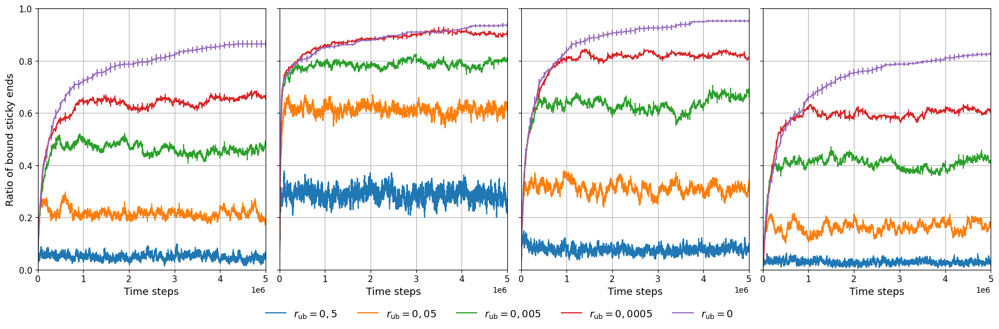

In [16]:
def get_particle_number_from_sims2(folder_names, index_particle_type):

    part_number = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        times, types, ids, part_positions = traj.read_observable_particles()
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        count = []
        for j in range(len(index_particle_type)):
            count.append(counts_pt[:, index_particle_type[j]])
        part_number.append(np.sum(count, axis=0))
    return np.asarray(part_number)

# ubind-Werte zu d (for legend labels)
ubind_values = ['0,5', '0,05', '0,005', '0,0005', '0']

# Prepare all file paths for d=1..5 and e=0..4 for the four panel datasets
panel_file_patterns = [
    "y_short_opt_multi_{d}_{e}.h5",
    "y_short_unopt_1_multi_{d}_{e}.h5",
    "y_short_unopt_2_multi_{d}_{e}.h5",
    "y_short_unopt_3_multi_{d}_{e}.h5"
]
panel_titles = ['A', 'B', 'C', 'D']  # Panel labels als Großbuchstaben

# Build list of lists of filenames for each panel
base_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/"
panel_folder_names = []
for pattern in panel_file_patterns:
    panel_files = []
    for d in range(1, 6):  # d = 1..5
        files_d = [
            os.path.join(base_dir, pattern.format(d=d, e=e))
            for e in range(5)
        ]
        panel_files.append(files_d)
    panel_folder_names.append(panel_files)

index_particle_type = [1, 3, 5]  # Choose relevant particle types

# Set up the figure and axes for 4 horizontally-arranged panels
fig, axs = plt.subplots(1, 4, figsize=(18, 6), sharey=True)

# For legend collection across all panels
legend_handles = []
legend_labels = []

# Panel-Buchstaben-Positionen (x-Positionen für jedes Panel, y außerhalb der Graphen)
panel_label_positions = [0.12, 0.36, 0.60, 0.84]  # Passe ggf. für Layout an

for panel_idx, (ax, panel_files_d) in enumerate(zip(axs, panel_folder_names)):
    for d, folder_names_d in enumerate(panel_files_d, 1):
        # Load the first file to get the time axis
        traj_ref = readdy.Trajectory(folder_names_d[0])
        time_pt_mech, counts_pt_mech = traj_ref.read_observable_number_of_particles()
        # Get mean and std for this set
        fused_linkers = get_particle_number_from_sims2(folder_names_d, index_particle_type)
        mean_fused_linkers = np.mean(fused_linkers, axis=0) / 150
        std_e_fused_linkers = np.std(fused_linkers, axis=0) / (np.sqrt(fused_linkers.shape[0]) * 150)
        handle = ax.errorbar(
            time_pt_mech, mean_fused_linkers, std_e_fused_linkers, errorevery=1000,
            label=fr'$r_{{\mathrm{{ub}}}}={ubind_values[d-1]}$'
        )
        if panel_idx == 0:
            legend_handles.append(handle[0])
            legend_labels.append(fr'$r_{{\mathrm{{ub}}}}={ubind_values[d-1]}$')

    # y-Achse bei 0 starten
    ax.set_ylim(bottom=0)
    # x-Achse bei 0 starten und bei 1e5 enden
    ax.set_xlim(left=0, right=5*10**6)

    ax.set_xticks(ax.get_xticks())
    ax.set_yticks(ax.get_yticks())
    ax.tick_params(labelsize=11)
    ax.set_xlabel("Time steps", fontsize=13)
    if panel_idx == 0:
        ax.set_ylabel("Ratio of bound sticky ends", fontsize=13)
    ax.grid(True)

# Panel-Beschriftungen außerhalb der Graphen (über jedem Panel)
#panel_titles = ['A', 'B', 'C', 'D']  # Panel labels als Großbuchstaben

# Panel-Beschriftungen außerhalb der Graphen (über jedem Panel)
#for idx, x in enumerate(panel_label_positions):
#    fig.text(x, 0.995, panel_titles[idx], fontsize=18, fontweight='bold', va='top', ha='left')

for ax in axs:
    ax.set_title("")
    ax.legend().remove()

plt.tight_layout(rect=[0, 0.08, 1, 1])  # leave space at the bottom for legend

# Add legend below all panels
fig.legend(legend_handles, legend_labels, loc='lower center', fontsize=13, ncol=len(legend_labels), frameon=False, bbox_to_anchor=(0.5, 0.01))

# Save and show
output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = "bound_se_average_panel_2.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()

### Pie Charts

#### concentration

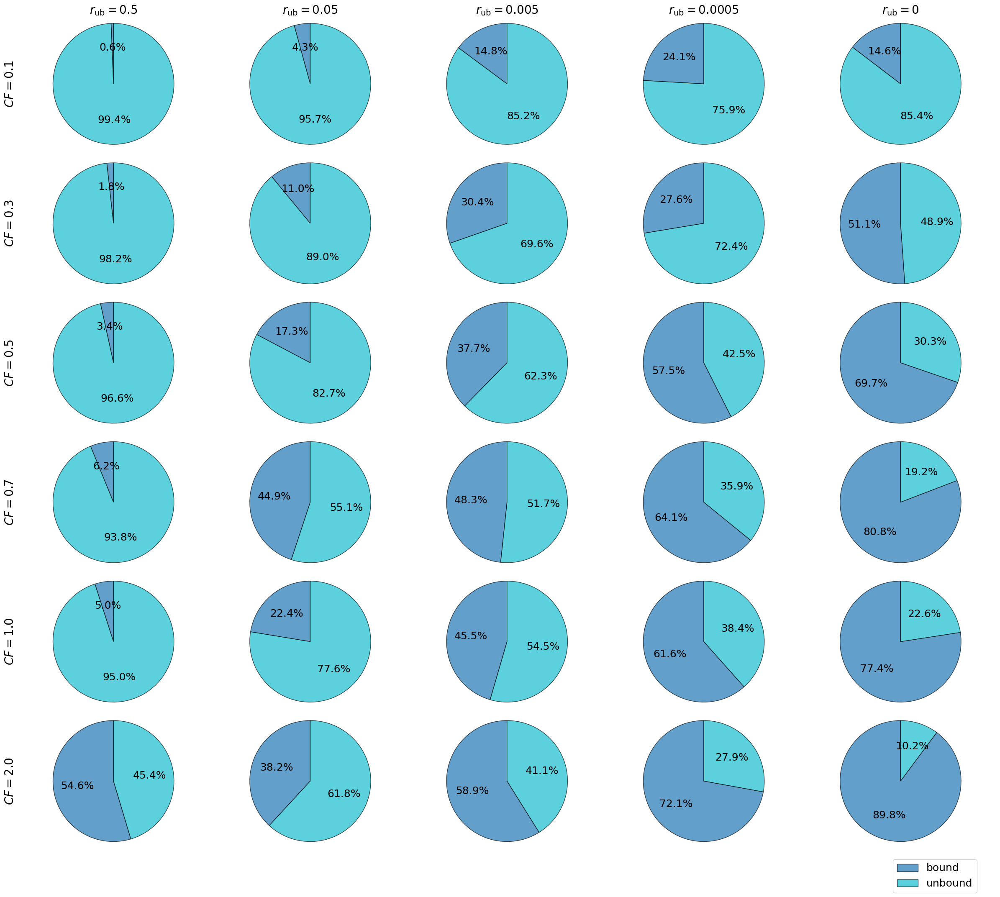

In [28]:
def get_bound_unbound_counts(folder_names, index_particle_type, total_sticky_ends):
    bound_counts = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        bound_per_timestep = np.sum(counts_pt[:, index_particle_type], axis=1)
        bound_counts.append(bound_per_timestep.mean())
    mean_bound = np.mean(bound_counts)
    mean_unbound = total_sticky_ends - mean_bound
    return mean_bound, mean_unbound

ubind_values = [0.5, 0.05, 0.005, 0.0005, 0]
index_particle_type = [1, 3, 5]
total_sticky_ends = 150

file_sets = [
    (r"$CF=0.1$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_5_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=0.3$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_4_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=0.5$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_3_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=0.7$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_2_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=1.0$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=2.0$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_1_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
]

fig, axes = plt.subplots(len(file_sets), 5, figsize=(24, 22))

legend_labels = ['bound', 'unbound']
legend_colors = ['#1F77B4', '#17BECF']
legend_wedges = None

for row, (set_name, all_files) in enumerate(file_sets):
    for d in range(1, 6):
        folder_names = [f for f in all_files if f"_{d}_" in f]
        mean_bound, mean_unbound = get_bound_unbound_counts(folder_names, index_particle_type, total_sticky_ends)
        sizes = [mean_bound, mean_unbound]
        ax = axes[row, d-1]
        wedges, texts, autotexts = ax.pie(
            sizes, labels=None, colors=legend_colors, autopct='%1.1f%%',
            startangle=90, wedgeprops={'edgecolor': 'black'}, radius=1.5
        )
        for wedge in wedges:
            wedge.set_alpha(0.7)
        for autotext in autotexts:
            autotext.set_fontsize(18)
        if row == 0:
            ax.set_title(fr'$r_{{\mathrm{{ub}}}}={ubind_values[d-1]}$', fontsize=20)
        else:
            ax.set_title("")
        if row == 0 and d == 1:
            legend_wedges = wedges
        ax.axis('equal')
    axes[row,0].set_ylabel(set_name, fontsize=20)

if legend_wedges is not None:
    fig.legend(legend_wedges, legend_labels, loc='upper right', bbox_to_anchor=(0.98, 0.02), fontsize=18)

#plt.suptitle("Ratio bound/unbound sticky ends for different $r_{\\mathrm{ub}}$ and motif concentrations", fontsize=24)
plt.tight_layout(rect=[0, 0.02, 1, 0.95])

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = "pie_motif_conc_se_1.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

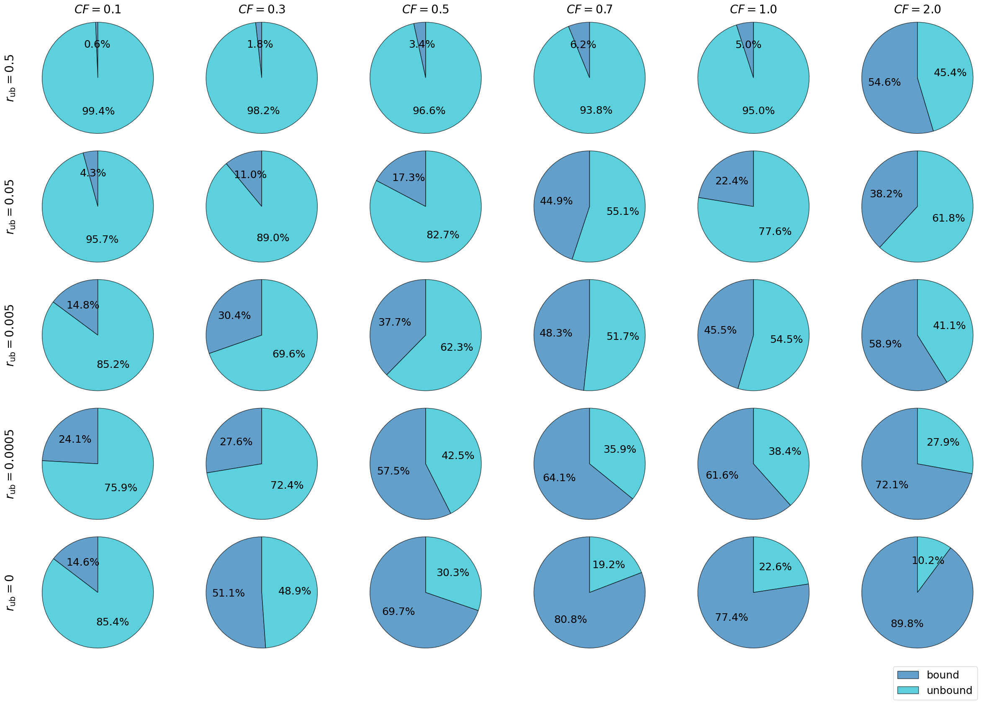

In [32]:
def get_bound_unbound_counts(folder_names, index_particle_type, total_sticky_ends):
    bound_counts = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        bound_per_timestep = np.sum(counts_pt[:, index_particle_type], axis=1)
        bound_counts.append(bound_per_timestep.mean())
    mean_bound = np.mean(bound_counts)
    mean_unbound = total_sticky_ends - mean_bound
    return mean_bound, mean_unbound

ubind_values = [0.5, 0.05, 0.005, 0.0005, 0]
index_particle_type = [1, 3, 5]
total_sticky_ends = 150

file_sets = [
    (r"$CF=0.1$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_5_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=0.3$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_4_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=0.5$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_3_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=0.7$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_2_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=1.0$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$CF=2.0$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/opt_se_conz_sampling/y_short_opt_1_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
]

# ACHTUNG: Zeilen und Spalten getauscht!
fig, axes = plt.subplots(5, len(file_sets), figsize=(24, 18))

legend_labels = ['bound', 'unbound']
legend_colors = ['#1F77B4', '#17BECF']
legend_wedges = None

for d in range(1, 6):
    for col, (set_name, all_files) in enumerate(file_sets):
        folder_names = [f for f in all_files if f"_{d}_" in f]
        mean_bound, mean_unbound = get_bound_unbound_counts(folder_names, index_particle_type, total_sticky_ends)
        sizes = [mean_bound, mean_unbound]
        ax = axes[d-1, col]
        wedges, texts, autotexts = ax.pie(
            sizes, labels=None, colors=legend_colors, autopct='%1.1f%%',
            startangle=90, wedgeprops={'edgecolor': 'black'}, radius=1.1
        )
        for wedge in wedges:
            wedge.set_alpha(0.7)  
        for autotext in autotexts:
            autotext.set_fontsize(18)
        # Spaltenbeschriftung: motif concentration in oberster Zeile
        if d == 1:
            ax.set_title(set_name, fontsize=20)
        else:
            ax.set_title("")
        # Zeilenbeschriftung: r_ub Werte links bei jeder Zeile
        if col == 0:
            ax.set_ylabel(fr'$r_{{\mathrm{{ub}}}}={ubind_values[d-1]}$', fontsize=20)
        else:
            ax.set_ylabel("")
        if d == 1 and col == 0:
            legend_wedges = wedges
        ax.axis('equal')

if legend_wedges is not None:
    fig.legend(legend_wedges, legend_labels, loc='lower right', bbox_to_anchor=(0.98, 0.01), fontsize=18)

#plt.suptitle("Ratio bound/unbound sticky ends for different $r_{\\mathrm{ub}}$ and motif concentrations", fontsize=24)
plt.tight_layout(rect=[0, 0.07, 1, 0.95])

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = "pie_motif_conc_se_2.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

#### angle potential

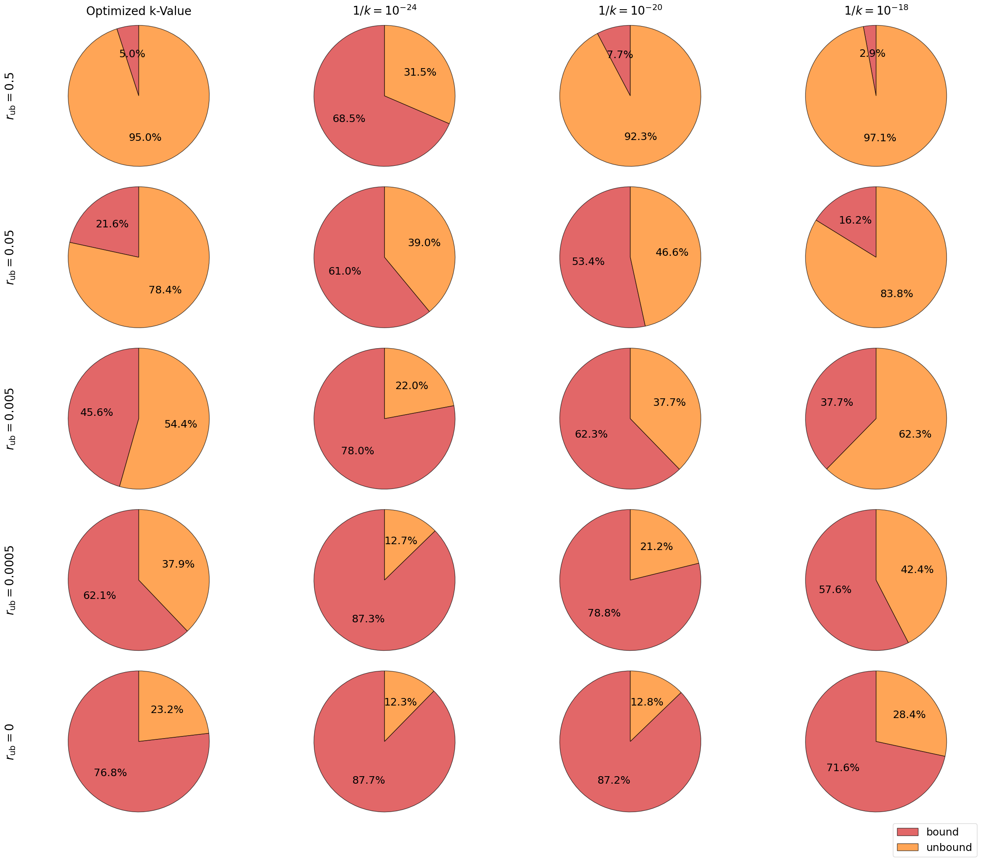

In [33]:
def get_bound_unbound_counts(folder_names, index_particle_type, total_sticky_ends):
    bound_counts = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        bound_per_timestep = np.sum(counts_pt[:, index_particle_type], axis=1)
        bound_counts.append(bound_per_timestep.mean())
    mean_bound = np.mean(bound_counts)
    mean_unbound = total_sticky_ends - mean_bound
    return mean_bound, mean_unbound

ubind_values = [0.5, 0.05, 0.005, 0.0005, 0]
index_particle_type = [1, 3, 5]
total_sticky_ends = 150

file_sets = [
    ("Optimized k-Value", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_opt_multi_{d}_{e}.h5"     for d in range(1,6) for e in range(5)]),
    (r"$1/k=10^{-24}$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_1_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$1/k=10^{-20}$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_2_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$1/k=10^{-18}$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_3_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
]

fig, axes = plt.subplots(5, len(file_sets), figsize=(24, 22)) 

legend_labels = ['bound', 'unbound']
legend_colors = ['#D62728', '#FF7F0E']
legend_wedges = None

for d in range(1, 6):
    for col, (set_name, all_files) in enumerate(file_sets):  # n Spalten
        folder_names = [f for f in all_files if f"_{d}_" in f]
        mean_bound, mean_unbound = get_bound_unbound_counts(folder_names, index_particle_type, total_sticky_ends)
        sizes = [mean_bound, mean_unbound]
        ax = axes[d-1, col]
        wedges, texts, autotexts = ax.pie(
            sizes, labels=None, colors=legend_colors, autopct='%1.1f%%',
            startangle=90, wedgeprops={'edgecolor': 'black'}, radius=1.1
        )
        for wedge in wedges:
            wedge.set_alpha(0.7)  
        for autotext in autotexts:
            autotext.set_fontsize(18)
        if d == 1:
            ax.set_title(set_name, fontsize=20)
        else:
            ax.set_title("")
        if col == 0:
            ax.set_ylabel(fr'$r_{{\mathrm{{ub}}}}={ubind_values[d-1]}$', fontsize=20)
        else:
            ax.set_ylabel("")
        if d == 1 and col == 0:
            legend_wedges = wedges
        ax.axis('equal')

if legend_wedges is not None:
    fig.legend(legend_wedges, legend_labels, loc='lower right', bbox_to_anchor=(0.98, 0.01), fontsize=18)

#plt.suptitle("Ratio bound/unbound sticky ends for different $r_{\\mathrm{ub}}$ and angle potentials", fontsize=24)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = "pie_diff_angle_pot_se_1.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

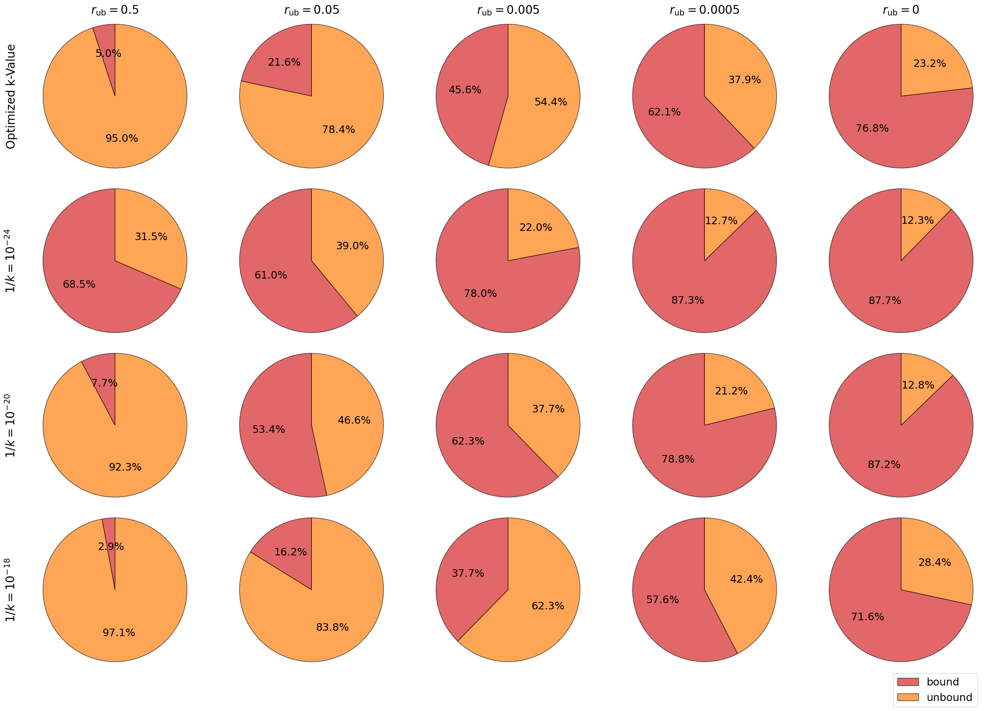

In [34]:
def get_bound_unbound_counts(folder_names, index_particle_type, total_sticky_ends):
    bound_counts = []
    for name_load_in in folder_names:
        traj = readdy.Trajectory(name_load_in)
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        bound_per_timestep = np.sum(counts_pt[:, index_particle_type], axis=1)
        bound_counts.append(bound_per_timestep.mean())
    mean_bound = np.mean(bound_counts)
    mean_unbound = total_sticky_ends - mean_bound
    return mean_bound, mean_unbound

ubind_values = [0.5, 0.05, 0.005, 0.0005, 0]
index_particle_type = [1, 3, 5]
total_sticky_ends = 150

file_sets = [
    ("Optimized k-Value", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_opt_multi_{d}_{e}.h5"     for d in range(1,6) for e in range(5)]),
    (r"$1/k=10^{-24}$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_1_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$1/k=10^{-20}$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_2_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
    (r"$1/k=10^{-18}$", [f"/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/bound_se_mean_values/y_short_unopt_3_multi_{d}_{e}.h5" for d in range(1,6) for e in range(5)]),
]

fig, axes = plt.subplots(len(file_sets), 5, figsize=(24, 18))

legend_labels = ['bound', 'unbound']
legend_colors = ['#D62728', '#FF7F0E']
legend_wedges = None

for row, (set_name, all_files) in enumerate(file_sets):  
    for d in range(1, 6): 
        folder_names = [f for f in all_files if f"_{d}_" in f]
        mean_bound, mean_unbound = get_bound_unbound_counts(folder_names, index_particle_type, total_sticky_ends)
        sizes = [mean_bound, mean_unbound]
        ax = axes[row, d-1]
        wedges, texts, autotexts = ax.pie(
            sizes, labels=None, colors=legend_colors, autopct='%1.1f%%',
            startangle=90, wedgeprops={'edgecolor': 'black'}, radius=1.1
        )
        for wedge in wedges:
            wedge.set_alpha(0.7)
        for autotext in autotexts:
            autotext.set_fontsize(18)
        if row == 0:
            ax.set_title(fr'$r_{{\mathrm{{ub}}}}={ubind_values[d-1]}$', fontsize=20)
        else:
            ax.set_title("")
        if d == 1:
            ax.set_ylabel(set_name, fontsize=20)
        else:
            ax.set_ylabel("")
        if row == 0 and d == 1:
            legend_wedges = wedges
        ax.axis('equal')

if legend_wedges is not None:
    fig.legend(legend_wedges, legend_labels, loc='lower right', bbox_to_anchor=(0.98, 0.001), fontsize=18)

#plt.suptitle("Ratio bound/unbound sticky ends for different $r_{\\mathrm{ub}}$ and angle potentials (transposed)", fontsize=24)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])

output_dir = "/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/graphs/"
filename = "pie_diff_angle_pot_se_2.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

# Not used

### Mittelung

In [28]:
#load saved config
traj_mech=readdy.Trajectory("/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/y_short_opt_multi_1_0.h5")

times_mech,types_mech,ids_mech,part_positions_mech=traj_mech.read_observable_particles()
time_pt_mech, counts_pt_mech = traj_mech.read_observable_number_of_particles()
#part_pos_eq=part_positions

time_e_mech, energy_mech=traj_mech.read_observable_energy()
time_obs_top_mech,obs_top_mech=traj_mech.read_observable_topologies()

####################
####################
####################

In [29]:
def get_particle_number_from_sims2(folder_name,index_particle_type):
    part_number=[]
    for i in range(len(folder_name)):
        #part_number_e=[]
        name_load_in=folder_name[i]
        traj=readdy.Trajectory(name_load_in)
        times,types,ids,part_positions=traj.read_observable_particles()
        time_pt, counts_pt = traj.read_observable_number_of_particles()
        #for t in range(len(time_pt)):
            #count=0
        count=[]
        for j in range(len(index_particle_type)):
            count.append(counts_pt[:,index_particle_type[j]] )
        part_number.append(np.sum(count,axis=0) )
        #part_number.append(part_number_e)
    return np.asarray(part_number)

In [30]:
folder_name_ex1=["/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/y_short_opt_multi_1_"+str(e)+".h5" for e in [0,1,2,3,4]]
fused_linkers_1=get_particle_number_from_sims2(folder_name_ex1,[1,3,5])

In [31]:
mean_fused_linkers=np.mean(fused_linkers_1,axis=0)/150
std_e_fused_linkers=np.std(fused_linkers_1,axis=0)/(np.sqrt(fused_linkers_1.shape[0])*150)

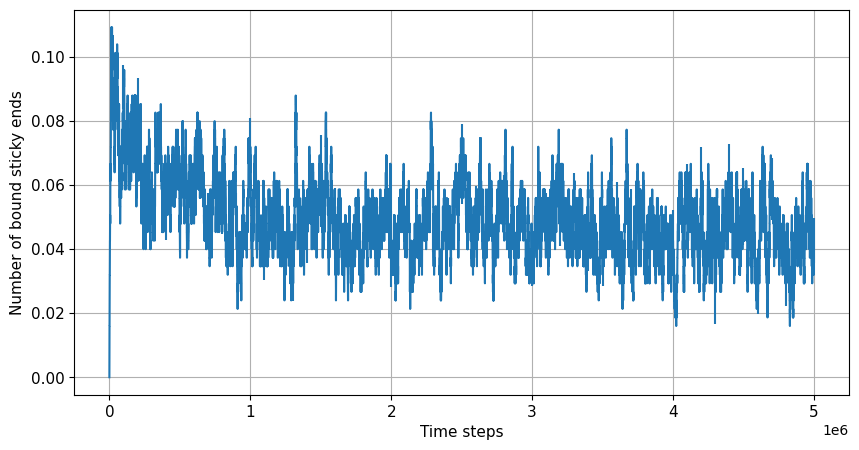

In [32]:
fig=plt.figure(figsize=(10,5))

#plt.errorbar(time_pt_mech,(counts_pt_mech[:,1]+counts_pt_mech[:,3]+counts_pt_mech[:,5])/150)
plt.errorbar(time_pt_mech,mean_fused_linkers, std_e_fused_linkers,errorevery=1000)
#plt.errorbar(time_pt_mech, counts_pt_mech[:,3])
#plt.errorbar(time_pt_mech ,counts_pt_mech[:,5])

#plt.xlim(0,10000)
#plt.ylim(-2,10)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Number of bound sticky ends", fontsize=11)
plt.xlabel("Time steps",fontsize=11)
plt.grid()

In [32]:
omega_t_sim1=np.geomspace(10**-3,10**5,10**3)
t_sim1=np.geomspace(10**-2,10**3,10**2)
storage_mod_sim1_avg_t,storage_mod_sim1_stde_t,loss_mod_sim1_avg_t,loss_mod_sim1_stde_t,relaxation_mod_sim1_avg_t,relaxation_mod_sim1_stde_t,conn_mat_sim_1_all_t,eigv_sim_1_all_t,tau_sim_1_all_t=get_time_avg_storage_loss_mod(obs_top=obs_top_mech,time_step=1,time_skip=500,omega_t=omega_t_sim1,t=t_sim1,edges_centre=4,edges_linker=3,cutoff_zero_eigv=10**-9,zeta=1,b=1,k=1,T=1,phi=1)

fig=plt.figure(figsize=(3,3))
ax1 = fig1.add_subplot(111)
ax1.errorbar(omega_t_sim1,storage_mod_sim1_avg_t,yerr=storage_mod_sim1_stde_t,fmt="-",label=r"$G'$",color="black")
ax1.errorbar(omega_t_sim1,loss_mod_sim1_avg_t,yerr=loss_mod_sim1_stde_t,fmt="-",label=r"$G''-\omega \eta$",color="red")

folder_1="/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/"
name_1="y_short_multi_5_"
add_num_1=[0]
index_particle_type_1= [31,33,35,37]
fused_linkers_1=get_particle_number_from_sims(folder=folder_1,name=name_1,add_num=add_num_1,index_particle_type=inde


mean_x=np.mean(fused_linkers_1/(64*4),axis=0)
#std_e_x=np.std(fused_linkers_1/60,axis=0)/np.sqrt(fused_linkers_1.shape[0])
step_c=1

plt.errorbar(time_pt_mech[::step_c],mean_x[::step_c],label="Y-motif conrad",color="green")
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.ylabel("Fraction of bound sticky ends",fontsize=11)
plt.xlabel("Time steps",fontsize=11)
plt.grid()
plt.legend(prop={size': 11},loc="lower right")

SyntaxError: invalid syntax (187600234.py, line 16)

In [ ]:
#get average of largest component from several sim repeats, in each sim average [t_skip:] time steps
def avg_largest_component_size(traj_names,t_skip):
    largest_comp_s_mean=[]
    for i in range(len(traj_names)):
        #read in traj
        traj_mech=readdy.Trajectory(traj_names[i])
        time_obs_top_mech,obs_top_mech=traj_mech.read_observable_topologies()
        obs_top_mech=obs_top_mech[t_skip:]
        #get component sizes
        particles_per_component_read_in=[]
        for i in range(len(obs_top_mech)):
            comp_lens=[]
            for j in range(len(obs_top_mech[i])):
                comp_lens.append(len(obs_top_mech[i][j].particles)/13)
            particles_per_component_read_in.append(comp_lens)
        #get largest component
        largest_comp_s=[]
        for i in range(len(particles_per_component_read_in)):
            largest_comp_s.append(np.max(particles_per_component_read_in[i]))
        largest_comp_s_mean.append(np.mean(largest_comp_s))
    return np.mean(largest_comp_s_mean), np.std(largest_comp_s_mean)/np.sqrt(len(traj_names))

In [ ]:
#comp_size_folder_name_ex1_cont2=["/mnt/d/D_phd/D_Nanomotif_Coarse_Graining_1/D_ML_parameter_opt_1/D_NCG_X_motif_conrad_1/D_shear_mod_2/prod_cont_2_checkpoint_"+str(e)+"/x_c_mech_opt_prod_cont_2_"+str(e)+".h5" for e in [0,1,2,3,4]]

comp_size_folder_name_ex1_cont2=["/home/xenia/Masterthesis_ReaDDy/Bayes_opt_nanomotifs/Phase_sep_Y_motif_short/y_short_opt_multi_1_"+str(e)+".h5" for e in [0,1,2,3,4]]
print(avg_largest_component_size(traj_names=comp_size_folder_name_ex1_cont2,t_skip=5250))